# Car-Removal Project
Authors:
 - Nikita Makarevich, 153989
 - Szymon Siemieniuk, 151947

In [88]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image
from copy import deepcopy

## Loading images, utility functions

In [83]:
paths = [
    "resources/DJI_20231031123704_0017_W.JPG",
    "resources/DJI_20231031123719_0022_W.JPG",
    "resources/DJI_20231031123746_0031_W.JPG"
]
orig_imgs = [cv2.imread(path, cv2.IMREAD_COLOR) for path in paths]

In [84]:
def convert_to_gray(imgs: list):    
    imgs_gray = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in imgs]
    return imgs_gray

def convert_to_hsv(imgs: list):    
    imgs_hsv = [cv2.cvtColor(img, cv2.COLOR_BGR2HSV) for img in imgs]
    return imgs_hsv


orig_imgs_gray = convert_to_gray(orig_imgs)
orig_imgs_hsv = convert_to_hsv(orig_imgs)

In [85]:
def vert_concat(*args):
    return np.concatenate([*args], axis=0)

def horiz_concat(*args):
    return np.concatenate([*args], axis=1)

def imshow(img: np.ndarray, scale=0.4, in_bgr=True):
    if in_bgr and img.shape[-1]==3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    
    display(Image.fromarray(img))

In [87]:
def take_pixels_from_imgs(imgs: list, inds: np.ndarray):
    # imgs_np = np.array(imgs)
    result = np.zeros_like(imgs[0])
    for ind in np.unique(inds):
        mask = (inds == ind)
        result[mask] = imgs[ind][mask] 
    return result

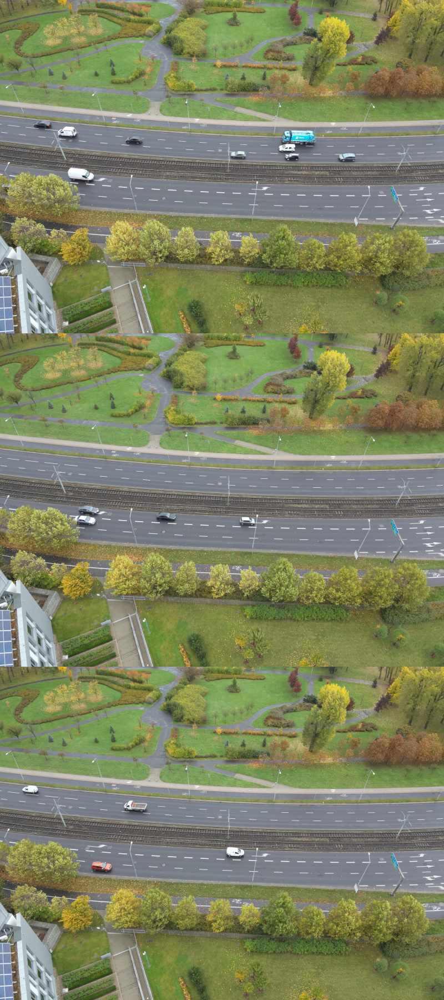

In [90]:
imshow(vert_concat(*orig_imgs), in_bgr=True)

## Attempt 1: Fancy medians
1. Notice that roads are dark, so that we could try to take min value of images. Create
two copies of solution.

2. Out of the 5 pictures (3 original, 2 mins), take the median

In [91]:
def get_min_pixel_image(images: list[np.ndarray]) -> np.ndarray:
    img_copy = deepcopy(images)
    img_copy = np.stack(images, axis=0)

    img_helper = img_copy[...,0] + img_copy[..., 1] + img_copy[..., 2]
    img_helper = np.argmin(img_helper, axis=0)
    img_helper = np.repeat(img_helper[:, :, np.newaxis], 3, axis=2)

    img_result = np.zeros_like(img_helper)
    for (i, image) in enumerate(img_copy):
        img_result = np.where(img_helper == i, image, img_result)
    
    img_result = img_result.astype(np.uint8)

    return img_result

In [92]:
def get_median(images):
    print(len(images))
    result = np.median(images, axis=0).astype(np.uint8)
    print(result.shape)
    return result

4
(1500, 2000, 3)


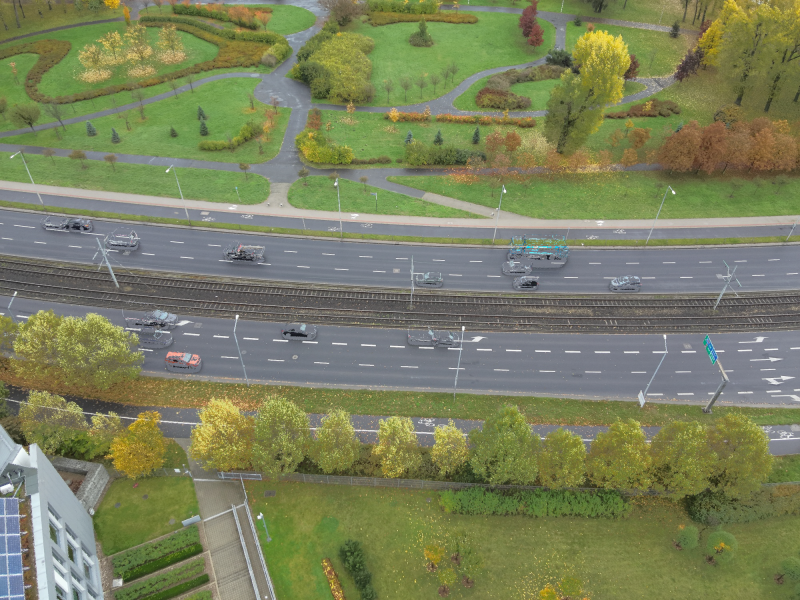

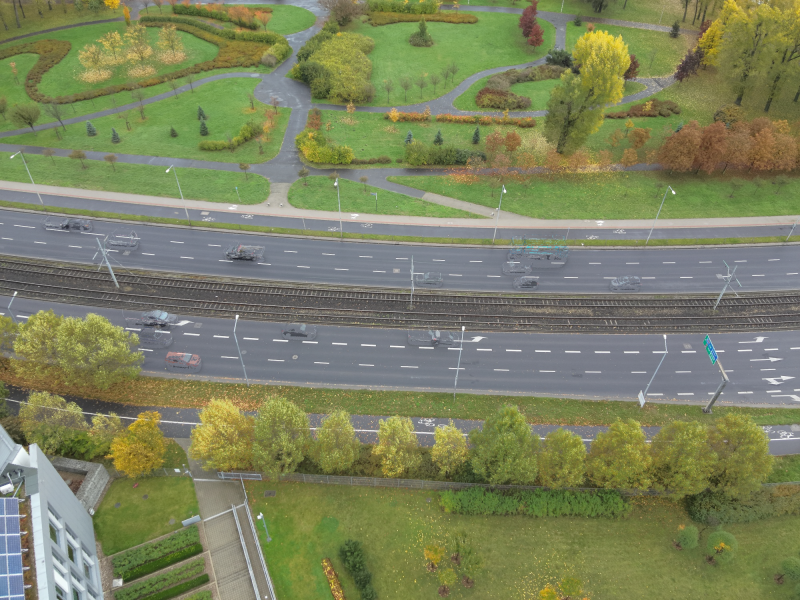

In [93]:
images = deepcopy(orig_imgs)
min_image = get_min_pixel_image(images)
images.append(min_image)
med_image = get_median(images)
imshow(min_image, in_bgr=True)
imshow(med_image, in_bgr=True)

## Attempt 2: Edge detection

In [99]:
### Edge detection through adaptive thresholding

def adaptive_thresh_gauss(img: np.ndarray, blocksize=3, constant=2):
    img_ad_gauss = cv2.adaptiveThreshold(
        img,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        blocksize,
        constant,
    )
    return img_ad_gauss

def pre_edge_detect(img: np.ndarray, gauss_kernel=3, median_kernel=5):
    """Detects edges using GaussianBlur -> AdaptiveGaussianThreshold -> MedianBlur"""
    res = img
    res = cv2.GaussianBlur(res, (gauss_kernel, gauss_kernel), 0)
    res = adaptive_thresh_gauss(res, blocksize=3, constant=1)
    # res = morph_close(res, kernel=3)
    res = cv2.medianBlur(res, median_kernel)

    return res

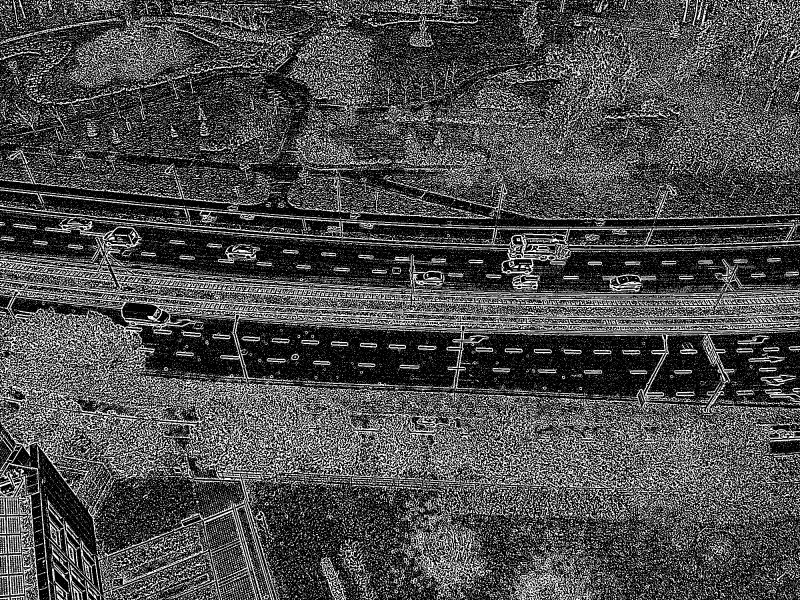

In [103]:
imshow(pre_edge_detect(orig_imgs_gray[0], gauss_kernel=5, median_kernel=5))

In [104]:
### Canny edge detection

def morph_close(img: np.ndarray, kernel=3):
    img_closed = cv2.morphologyEx(
        img, cv2.MORPH_CLOSE, kernel=np.ones((kernel, kernel), np.uint8)
    )
    return img_closed

def morph_open(img: np.ndarray, kernel=3):
    img_closed = cv2.morphologyEx(
        img, cv2.MORPH_OPEN, kernel=np.ones((kernel, kernel), np.uint8)
    )
    return img_closed

def canny_edge_detect(img: np.ndarray, canny_aperture=3, closing_kernel=3, canny_threshs=None):
    img = cv2.GaussianBlur(img, (3, 3), 0)
    otsu_thresh, _ = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if canny_threshs is None:
        canny_high = 0.75 * otsu_thresh
        canny_low = 0.60 * otsu_thresh
    else:
        if isinstance(canny_threshs[0], int):
            canny_low, canny_high = canny_threshs
        else:
            canny_low = canny_threshs[0] * otsu_thresh
            canny_high = canny_threshs[1] * otsu_thresh

    img_canny = cv2.Canny(img, canny_low, canny_high, canny_aperture)
    # img_canny = morph_close(img_canny, kernel=closing_kernel)
    return img_canny

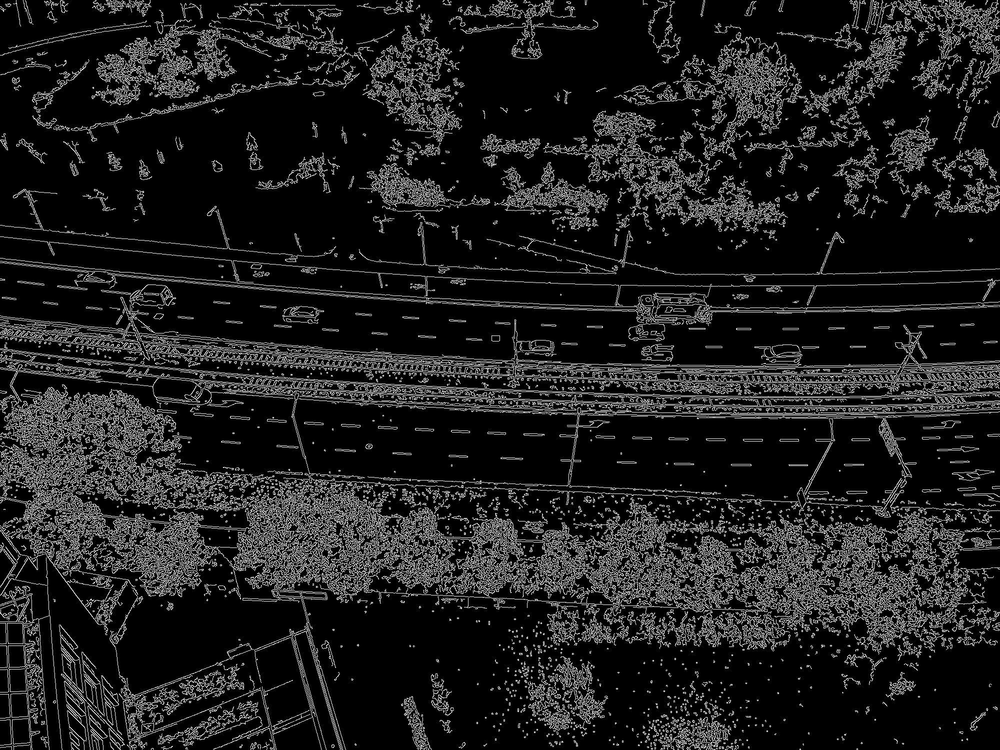

In [105]:
imshow(canny_edge_detect(orig_imgs_gray[0], canny_aperture=3, canny_threshs=(50, 150)), scale=1)

## Attempt3: Harris Corner detector

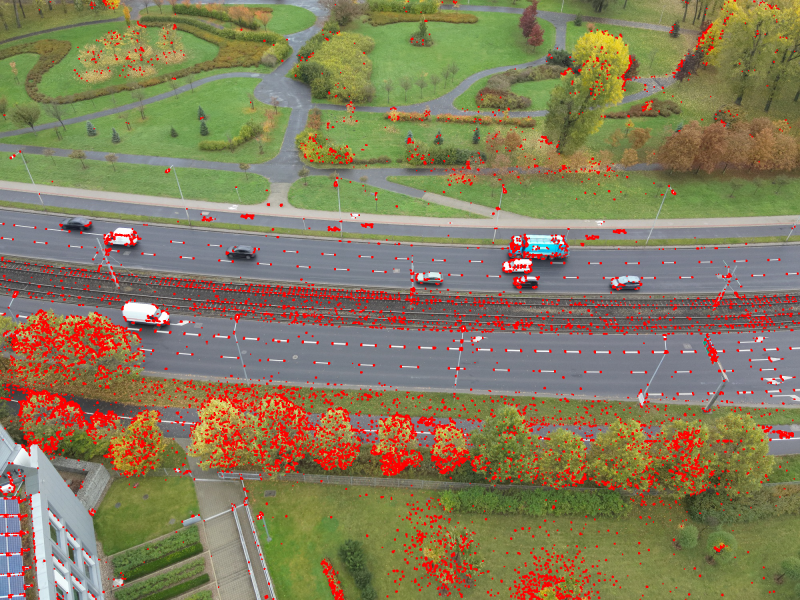

In [19]:
temp = orig_imgs[0].copy()
dst = cv2.cornerHarris(orig_imgs_gray[0], 3, 3, 0.01)
# result is dilated for marking the corners, not important
dst = cv2.dilate(dst, None)

# Threshold for an optimal value, it may vary depending on the image.
temp[dst > 0.01 * dst.max()] = [0, 0, 255]
imshow(temp)

## Attempt 4: Keypoints

Choose pixel with the smallest number of keypoints in its neighborhood

In [106]:
def show_kp(img, kp):
    img_kp = cv2.drawKeypoints(
        img, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT
    )
    return img_kp

In [107]:
sift = cv2.SIFT_create()  # kp + desc
orb = cv2.ORB_create()  # kp + desc
fast = cv2.FastFeatureDetector_create()  # only kp
star = cv2.xfeatures2d.StarDetector_create()  # only kp

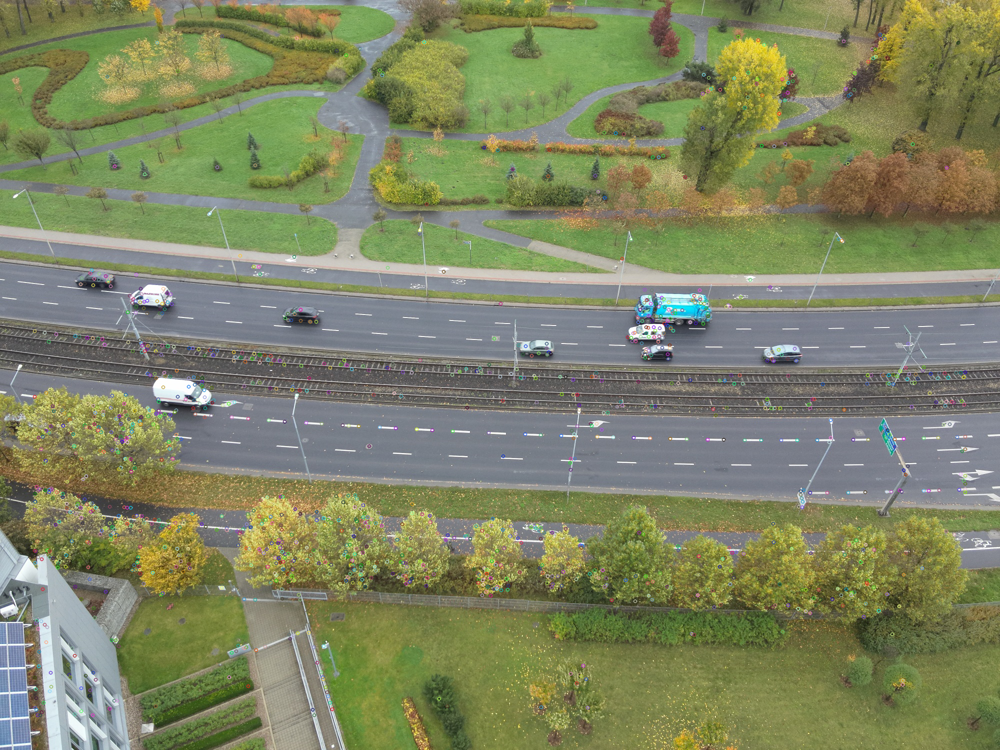

In [108]:
sift_kp, sift_desc = sift.detectAndCompute(orig_imgs_gray[0], None)
orb_kp, orb_desc = orb.detectAndCompute(orig_imgs_gray[0], None)
fast_kp = fast.detect(orig_imgs_gray[0], None)
star_kp = star.detect(orig_imgs_gray[0], None)

imshow(show_kp(orig_imgs[0], star_kp), scale=1)

In [109]:
def get_near_kps_descriptor(img: np.ndarray, kp_detector, window_size: int = 50):
    kps = kp_detector.detect(img, None)
    kp_coords = np.array([kp.pt for kp in kps], dtype=np.uint)

    kp_mask = np.zeros(img.shape[:2], dtype=np.uint8)
    kp_mask[kp_coords[:, 1], kp_coords[:, 0]] = 1


    window_size = 50
    kernel = np.ones((window_size, window_size))
    pixel_descs = cv2.filter2D(kp_mask, -1, kernel, cv2.BORDER_ISOLATED)
    return pixel_descs

In [110]:
pixel_descs = [get_near_kps_descriptor(img, star, window_size=100)[np.newaxis] for img in orig_imgs]
all_pixel_descs = np.vstack(pixel_descs)
best_inds = all_pixel_descs.argmin(axis=0)
res_img = take_pixels_from_imgs(orig_imgs, best_inds)

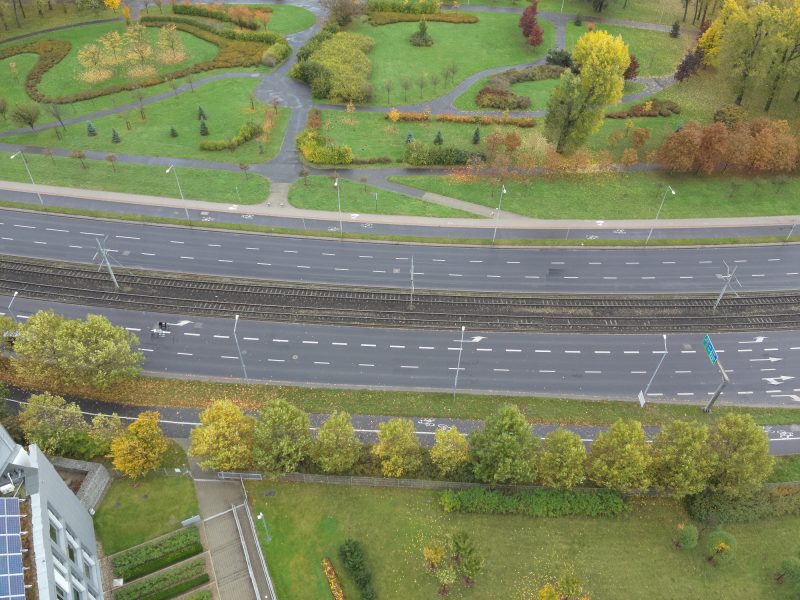

In [111]:
imshow(res_img)